# Analyzing the energy conservation for the nonlinear advection term

This notebook analyzes the advection term

$$
\begin{gather*}
    uu_x = \frac{1}{2}(u^2)_x
\end{gather*}
$$

in PDEs such as Burgers' equation and the Kuramoto-Sivashinsky equation, where the left form is the non-conservative and the right is the conservative form. We see that for the finite difference approximations, regardless of the conservative form or not, the energy preserving condition 

$$
\begin{gather*}
    \mathbf x^\top \mathbf H(\mathbf x \otimes \mathbf x) = 0  \quad \text{ or } \quad \mathbf x^\top \mathbf F \mathbf x^{\langle 2 \rangle} = 0
\end{gather*}
$$

is not satisfied. However, proposed in this [paper](http://epubs.siam.org/doi/10.1137/0905060), a convex combination of the two allows the formation of a energy-preserving finite difference ODE model. Below, we check that this is true for the Burgers' equation and Kuramoto Sivashinksy equation using the following 3 metrics

1. Energy Trend:

$$
\begin{gather*}
    \mathrm{E} = \sum_i^T \frac{1}{2} \| x_{1:N}^i \|^2
\end{gather*}
$$

2. Constraint Residual:

$$
\begin{gather*}
    \mathrm{CR} = \sum_{1\leq i,j,k\leq N} | h_{ijk}+h_{jik}+h_{kji} |
\end{gather*}
$$

3. Constraint Violation:

$$
\begin{gather*}
    \mathrm{CV} = \sum_{i=1}^N (x_{1:N}^i)^\top \mathbf H (x_{1:N}^i \otimes x_{1:N}^i) = \sum_{i=1}^N (x_{1:N}^i)^\top \mathbf F (x_{1:N}^i)^{\langle 2 \rangle}
\end{gather*}
$$


In [1]:
using LaTeXStrings
using LinearAlgebra
using Plots
using SparseArrays

include("../src/model/Burgers.jl")
include("../src/model/KS.jl")
include("../src/LiftAndLearn.jl")
const LnL = LiftAndLearn


Main.LiftAndLearn

## Burgers' Equation

The viscous Burgers' equation is converted into an ODE using the Finite Difference (FD) method and integrated using a semi-implicit scheme.

In [ ]:
# First order Burger's equation setup
burger = Burgers(
    [0.0, 1.0], [0.0, 1.0], [0.05, 0.15],
    2^(-7), 1e-2, 1, "periodic"
)

init_wave = (A,a,b) -> A .* sin.(2 * pi * ceil(a) * burger.x .+ b) 
;

In [ ]:
A = Vector{Matrix{Float64}}(undef, 3)
F = Vector{Matrix{Float64}}(undef, 3)

# Generate the FOM for non-conservative, conservative, and energy-preserving
A[1], F[1] = burger.generateMatrix_NC_periodic(burger, burger.μs[1])
A[2], F[2] = burger.generateMatrix_C_periodic(burger, burger.μs[1])
A[3], F[3] = burger.generateEPmatrix(burger, burger.μs[1])
;

In [ ]:
# Integrate the FOMs and attain the states 
states = Vector{Matrix{Float64}}(undef, 3)
for i in 1:3
    states[i] = burger.semiImplicitEuler(A[i], F[i], burger.t, init_wave(1.2, 2.0, 0.1))
end

In [ ]:
en1 = norm.(eachcol(states[1]), 2)
en2 = norm.(eachcol(states[2]), 2)
en3 = norm.(eachcol(states[3]), 2)

plot(burger.t, en1, label=L"\mathrm{Non}\rm{-}\mathrm{conservative}", lw=6)
plot!(burger.t, en2, label=L"\mathrm{Conservative}", lw=4, ls=:dot)
plot!(burger.t, en3, label=L"\mathrm{Energy~Preserving}", lw=2, ls=:dash)
plot!(xlabel=L"t", ylabel=L"\mathrm{Energy}", legend=:topright, size=(600, 400))
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13, foreground_color_legend=nothing)

In [ ]:
cr1 = LnL.EPConstraintResidual(F[1], size(F[1], 1), "F")
cr2 = LnL.EPConstraintResidual(F[2], size(F[2], 1), "F")
cr3 = LnL.EPConstraintResidual(F[3], size(F[3], 1), "F")

println("Constraint residual for non-conservative: ", cr1)
println("Constraint residual for conservative: ", cr2)
println("Constraint residual for energy preserving: ", cr3)

In [ ]:
cv1 = LnL.EPConstraintViolation(states[1], F[1], "F")
cv2 = LnL.EPConstraintViolation(states[2], F[2], "F")
cv3 = LnL.EPConstraintViolation(states[3], F[3], "F")

plot(burger.t, cv1, label=L"\mathrm{Non}\rm{-}\mathrm{conservative}", lw=2)
plot!(burger.t, cv2, label=L"\mathrm{Conservative}", lw=2)
plot!(burger.t, cv3, label=L"\mathrm{Energy~Preserving}", lw=2)
plot!(xlabel=L"t", ylabel=L"\mathrm{Constraint~Violation}", legend=:topright, size=(600, 400))
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13, foreground_color_legend=nothing)

In [ ]:
c1, c2, c3 = theme_palette(:default)
plot(burger.t, cv3, label=L"\mathrm{Energy~Preserving}", lw=2, c=c3)
plot!(xlabel=L"t", ylabel=L"\mathrm{Constraint~Violation}", legend=:topright, size=(600, 400))
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13, foreground_color_legend=nothing)

## Kuramoto-Sivashinsky Equation (KSE)

For the KSE, we include the model constructed using the Finite Difference (FD) and Spectral-Galerkin (SG) method into the analysis.

In [2]:
# Settings for the KS equation
KSE = KS(
    [0.0, 100.0], [0.0, 300.0], [1, 0.1],
    256, 0.01, 1, "nc"
)

L = KSE.Omega[2]
u0 = cos.((2*π*KSE.x)/L) + 0.1*cos.((4*π*KSE.x)/L)  # initial condition
;

In [3]:
A = Vector{AbstractMatrix{Float64}}(undef, 5)
F = Vector{AbstractMatrix{Float64}}(undef, 5)

# Generate the FOM for non-conservative, conservative, and energy-preserving
A[1], F[1] = model_FD(KSE, KSE.μs[1])
KSE.type = "c"
A[2], F[2] = model_FD(KSE, KSE.μs[1])
KSE.type = "ep"
A[3], F[3] = model_FD(KSE, KSE.μs[1])
A[4], F[4] = model_SG(KSE, KSE.μs[1])  # Spectral Galerkin
A[5], F[5] = model_PS(KSE, KSE.μs[1])  # Pseudo-Spectral
;

In [4]:
# Integrate the FOMs and attain the states 
states = Vector{Matrix{Float64}}(undef, 5)
for i in 1:3
    states[i] = KSE.integrate_FD(A[i], F[i], KSE.t, u0)
end
states[4], _ = KSE.integrate_SG(A[4], F[4], KSE.t, u0)
states[5], _ = KSE.integrate_PS(A[5], F[5], KSE.t, u0)
;

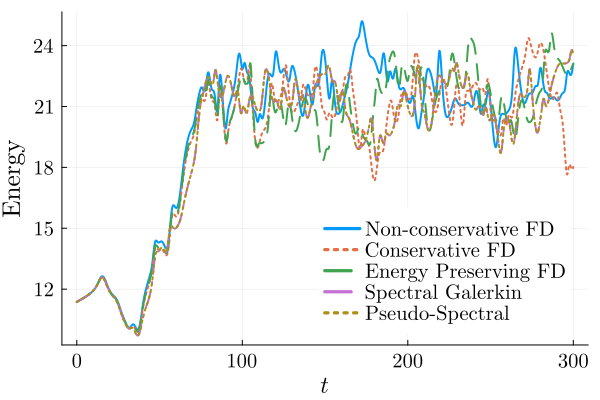

In [5]:
en1 = norm.(eachcol(states[1]), 2)
en2 = norm.(eachcol(states[2]), 2)
en3 = norm.(eachcol(states[3]), 2)
en4 = norm.(eachcol(states[4]), 2)
en5 = norm.(eachcol(states[5]), 2)

plot(KSE.t, en1, lw=2, fontfamily="Computer Modern", label="Non-conservative FD")
plot!(KSE.t, en2, label="Conservative FD", lw=2, ls=:dot)
plot!(KSE.t, en3, label="Energy Preserving FD", lw=2, ls=:dash)
plot!(KSE.t, en4, label="Spectral Galerkin", lw=2, ls=:dashdot)
plot!(KSE.t, en5, label="Pseudo-Spectral", lw=2, ls=:dot)
plot!(xlabel=L"t", ylabel="Energy", legend=:topright, size=(600, 400))
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13, foreground_color_legend=nothing, legend=:bottomright)

In [6]:
# Convert the F matrix of pseudo-spectral from a square to quadratic matrix
foo = deepcopy(F[5])
F[5] = spzeros(size(F[4]))
for (i, j) in enumerate(vcat(1, [1 + sum(k:KSE.nx) for k in KSE.nx:-1:2]))
    F[5][i, Int(j)] = foo[i, i]
end

In [7]:
cr1 = LnL.EPConstraintResidual(F[1], size(F[1], 1), "F")
cr2 = LnL.EPConstraintResidual(F[2], size(F[2], 1), "F")
cr3 = LnL.EPConstraintResidual(F[3], size(F[3], 1), "F")
cr4 = LnL.EPConstraintResidual(F[4], size(F[4], 1), "F")
cr5 = LnL.EPConstraintResidual(F[5], size(F[5], 1), "F")

println("Constraint residual for non-conservative FD: ", cr1)
println("Constraint residual for conservative FD: ", cr2)
println("Constraint residual for energy preserving FD: ", cr3)
println("Constraint residual for spectral Galerkin: ", cr4)
println("Constraint residual for pseudo-spectral: ", cr5)

Constraint residual for non-conservative FD: 1966.0799999999638
Constraint residual for conservative FD: 983.0399999999819
Constraint residual for energy preserving FD: 6.661338147750939e-16
Constraint residual for spectral Galerkin: 263543.9351436274
Constraint residual for pseudo-spectral: 1544.155621092454


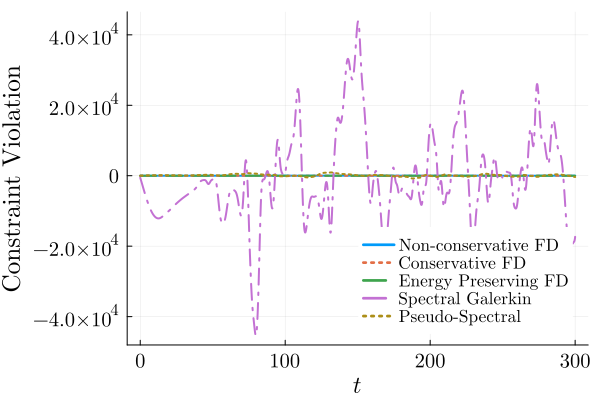

In [8]:
cv1 = LnL.EPConstraintViolation(states[1], F[1], "F")
cv2 = LnL.EPConstraintViolation(states[2], F[2], "F")
cv3 = LnL.EPConstraintViolation(states[3], F[3], "F")
cv4 = LnL.EPConstraintViolation(states[4], F[4], "F")
cv5 = LnL.EPConstraintViolation(states[5], F[5], "F")

plot(KSE.t, cv1, lw=2, fontfamily="Computer Modern", label="Non-conservative FD")
plot!(KSE.t, cv2, label="Conservative FD", lw=2, ls=:dot)
plot!(KSE.t, cv3, label="Energy Preserving FD", lw=2, ls=:dash)
plot!(KSE.t, cv4, label="Spectral Galerkin", lw=2, ls=:dashdot)
plot!(KSE.t, cv5, label="Pseudo-Spectral", lw=2, ls=:dot)
plot!(xlabel=L"t", ylabel="Constraint Violation", legend=:bottomright, size=(600, 400))
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=11, foreground_color_legend=nothing)

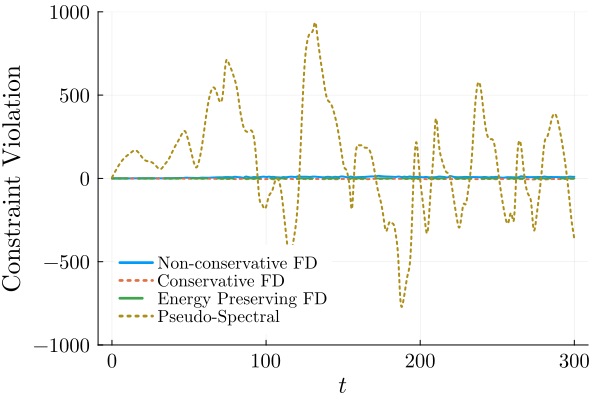

In [9]:
c1, c2, c3, c4, c5 = theme_palette(:default)
plot(KSE.t, cv1, lw=2, fontfamily="Computer Modern", label="Non-conservative FD")
plot!(KSE.t, cv2, label="Conservative FD", lw=2, ls=:dot)
plot!(KSE.t, cv3, label="Energy Preserving FD", lw=2, ls=:dash)
plot!(KSE.t, cv5, label="Pseudo-Spectral", lw=2, ls=:dot, color=c5)
plot!(xlabel=L"t", ylabel="Constraint Violation", legend=:bottomright, size=(600, 400))
ylims!(-1000, 1000)
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=11, foreground_color_legend=nothing, legend=:bottomleft)

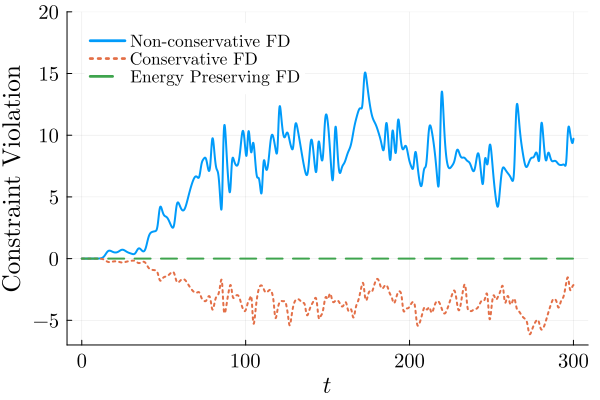

In [13]:
plot(KSE.t, cv1, lw=2, fontfamily="Computer Modern", label="Non-conservative FD")
plot!(KSE.t, cv2, label="Conservative FD", lw=2, ls=:dot)
plot!(KSE.t, cv3, label="Energy Preserving FD", lw=2, ls=:dash)
plot!(xlabel=L"t", ylabel="Constraint Violation", legend=:bottomright, size=(600, 400))
ylims!(-7, 20)
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=11, foreground_color_legend=nothing, legend=:topleft)

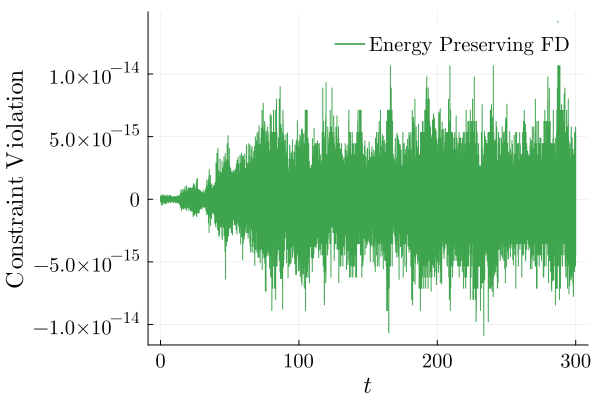

In [14]:
c1, c2, c3 = theme_palette(:default)
# plot(KSE.t, cv1, label="Non-conservative FD", lw=3, c=c1)
plot(KSE.t, cv3, fontfamily="Computer Modern", label="Energy Preserving FD", lw=1, c=c3)
plot!(xlabel=L"t", ylabel=L"\mathrm{Constraint~Violation}", legend=:topright, size=(600, 400))
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13, foreground_color_legend=nothing)

## Conclusion

- All methods show similar energy trends.
- However, only the energy-preserving FD method which is a convex combination of the conserative and nonconservative FD methods is able to satisfy the energy-preserving structure that the actual dynamics satisfies.